<a href="https://colab.research.google.com/github/Daniel-tns/MVP/blob/main/MVP_1_Analise_de_Dados_e_Boas_Praticas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**MVP Sprint I: Análise de Dados e Boas Práticas**

##1.Definição do Problema

O dataset utilizado neste MVP será o **Credit Card Churn Prediction**, proveniente do Kaggle e que pode ser acessado através do link https://www.kaggle.com/datasets/anwarsan/credit-card-bank-churn.

O objetivo do dataset é entender quais aspectos são mais relavantes para explicar o problema da perda de clientes, que deixam de utilizar o cartão de crédito do banco emissor e transferem seus negócios para a concorrência. Este dataset possui diversos atributos relacionados à utilização de cartão de crédito pelos clientes da instituição financeira e à informações cadastrais dos clientes, como idade, gênero, número de dependentes, nível de escolaridade e estado cívil. Na base dados há a identificação do cliente "churn", que deixou de utilizar o cartão de crédito da instituição financiera, e do cliente "não churn", que permanece utilizando cartao de crédito e fazendo negócios com  banco. A classificação do cliente está informada no atributo "Attrition_Flag", com a marcação de "Existing Customer" para os clientes "não churn" e "Attrited Customer" para os clientes "churn". Este atributo terá sua nomeclatura alterada para "Churn". 

Trata-se então de um problema de aprendizado supervisionado de Classificação, com os dados previamente rotulados para identificação dos clientes classificados como "churn".

As duas últimas colunas do dataset serão excluídas ao importar o arquivo por não trazerem informações sobre os clientes e do colobarador que disponibilizou o dataset no Kaggle.

Os atributos do dataset serão renomeados a fim de facilitar a análise e são definidos conforme abaixo:



**Informações sobre os atributos:**


1. **CLIENTNUM -> "ID_Cliente":** Identificador único do cliente titular da cartão de crédito.
2. **Attrition_Flag -> "Churn":** Classificação do cliente em "churn" (Attrited Customer) e "não churn" (Existing Customer). Os termos serão substituídos por 1 e 0 para identificação do cliente "churn" e "não churn", respectivamente.
3. **Customer_Age -> "Idade":** Idade do cliente em anos.
4. **Gender -> "Genero":** Gênero do cliente, sendo M = Masculino e F = Feminino.
5. **Dependent_count -> "Numero_dependentes":** Número de dependentes cadastrados para o cliente.
6. **Education_Level -> "Escolaridade":** Nível de escolaridade do cliente, contendo os seguintes valores: College (Universitário), Doctorate (Doutorado), Graduate (pós-graduado), High School (Ensino médio), Post-Graduate (Pós-graduado), Uneducated (sem instrução) e Unknown (desconhecido).
7. **Marital_Status -> "Estado_civil":** Estado cívil do cliente, contendo os seguintes valores: Married (Casado), Single (Solteiro), Divorced (Divorciado) e Unknown (Desconhecido).
8. **Income_Category - > "Categoria_Renda":** Categoria de Renda Anual do cliente titular do cartão, contendo os seguintes grupos: less than $40k, $40k - $60k, $60k - $80k, $80k - $120k, $120k +, Unknown (Desconhecido).
9. **Card_Category -> "Categoria_Cartao":** Tipo de cartão utilizado pelo cliente, contendo os seguintes valores: Blue, Gold, Platinum e Silver.
10. **Months_on_book -> "Tempo_relacionamento":** Tempo de relacionamento com o banco em meses.
11. **Total_Relationship_Count -> "Quantidade_produtos":** Quantidade total de produtos que o cliente possui com o banco.
12. **Months_Inactive_12_mon -> "Qtd_meses_inativo_12m":** Quantidade de meses de inativaidade do cliente nos últimos 12 meses.
13. **Contacts_Count_12_mon -> "Qtd_contatos_12m":** Quantidade de contatos realizado pelo banco com o cliente nos últimos 12 meses.
14. **Credit_Limit -> "Limite_credito":** Limite de crédito do cliente em $.
15. **Total_Revolving_Bal -> "Saldo_rotativo_cartao":** Saldo rotativo total do cartão de crédito do cliente.
16. **Avg_Open_To_Buy -> "Media_limite_credito_disponivel_12m":** Valor médio de limite de crédito disponível para compras pelo cliente nos últimos 12 meses em moeda.
17. **Total_Amt_Chng_Q4_Q1 -> "Variacao_valor_transacao_Q4_Q1":** variação no valor total das transações realizadas pelo cliente no 4º Trimestre (Q4) em comparação com o 1º Trimeste (Q1), em percentual.
18. **Total_Trans_Amt -> "Valor_total_transacoes_12m":** Valor total das transações realizadas pelo cliente nos últimos 12 meses, em moeda.
19. **Total_Trans_Ct -> "Qtd_total_transacoes_12m":** Quantidade total de transações realizadas pelo cliente nos últimos 12 meses.
20. **Total_Ct_Chng_Q4_Q1 -> "Variacao_total_transacoes_Q4_Q1":** Variação na quantidade total de transações realizadas pelo cliente no 4º Trimestre (Q4) em comparação com o 1º Trimestre (Q1), em percentual.
21. **Avg_Utilization_Ratio -> "Taxa_media_uso_cartao":** Taxa média de utilização do cartão pelo cliente.




*Definição do problema*

Objetivo: entender e descrever claramente o problema que está sendo resolvido. 

Qual é a descrição do problema?

Este é um problema de aprendizado supervisionado ou não supervisionado?

**Que premissas ou hipóteses você tem sobre o problema?**

**Que restrições ou condições foram impostas para selecionar os dados?**

Defina cada um dos atributos do dataset. 


##2.Importação do dados de um repositório no Github

Importando as bibliotecas necessárias para análise e pré-processamento dos dados.

In [1]:
# Importando as bibliotecas utilizadas
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.patches import Patch, Polygon
from matplotlib.lines import Line2D
import matplotlib.ticker as mtick
import seaborn as sns
import missingno as ms # para tratamento de missings
from pandas import set_option
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OrdinalEncoder # ordinal encoding
from sklearn.preprocessing import OneHotEncoder # one-hot encoding e dummy encoding
from sklearn.model_selection import train_test_split

from IPython.display import display, Markdown

Importação do arquivo credit_card_churn.csv disponível no repositório do Github.

In [2]:
# Carregando o arquivo csv usando Pandas informando uma URL

# Informa a URL de importação do dataset no Github
url = "https://raw.githubusercontent.com/Daniel-tns/MVP/main/credit_card_churn.csv"

# Informa o cabeçalho das colunas
colunas = ['ID_Cliente', 'Churn', 'Idade', 'Genero', 'Numero_dependentes', 'Escolaridade', 'Estado_civil', 'Categoria_Renda', 'Categoria_Cartao',
           'Tempo_relacionamento', 'Quantidade_produtos', 'Qtd_meses_inativo_12m', 'Qtd_contatos_12m', 'Limite_credito', 'Saldo_rotativo_cartao',
           'Media_limite_credito_disponivel_12m', 'Variacao_valor_transacao_Q4_Q1','Valor_total_transacoes_12m', 'Qtd_total_transacoes_12m',
           'Variacao_total_transacoes_Q4_Q1', 'Taxa_media_uso_cartao',
           'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
           'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2']

# Realiza a leitura do arquivo utilizando as colunas informadas
dataset = pd.read_csv(url, names = colunas, skiprows = 1, delimiter = ',')

# As 2 ultimas colunas do dataset devem ser desconsideradas por recomendação do construtor por não trazerem informações relacionadas aos clientes.

# Exluindo as 2 ultimas colunas do dataset e atribuindo a um novo dataframe
clientes = dataset.drop(['Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
                         'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
                          axis = 1)

In [3]:
# Verificando as 5 primeiras linhas do dataset
clientes.head()

,ID_Cliente,Churn,Idade,Genero,Numero_dependentes,Escolaridade,Estado_civil,Categoria_Renda,Categoria_Cartao,Tempo_relacionamento,...,Qtd_meses_inativo_12m,Qtd_contatos_12m,Limite_credito,Saldo_rotativo_cartao,Media_limite_credito_disponivel_12m,Variacao_valor_transacao_Q4_Q1,Valor_total_transacoes_12m,Qtd_total_transacoes_12m,Variacao_total_transacoes_Q4_Q1,Taxa_media_uso_cartao
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


Alteração da ordenação das colunas para que a coluna alvo **"Churn"** seja a última coluna do dataset, facilitando a sua identificação.

In [4]:
# Alterando a ordem das colunas para que a coluna "Churn" fique na última posição do dataset
clientes = clientes[['ID_Cliente',
                     'Idade',
                     'Genero',
                     'Numero_dependentes',
                     'Escolaridade',
                     'Estado_civil',
                     'Categoria_Renda',
                     'Categoria_Cartao',
                     'Tempo_relacionamento',
                     'Quantidade_produtos',
                     'Qtd_meses_inativo_12m',
                     'Qtd_contatos_12m',
                     'Limite_credito',
                     'Saldo_rotativo_cartao',
                     'Media_limite_credito_disponivel_12m',
                     'Variacao_valor_transacao_Q4_Q1',
                     'Valor_total_transacoes_12m',
                     'Qtd_total_transacoes_12m',
                     'Variacao_total_transacoes_Q4_Q1',
                     'Taxa_media_uso_cartao',
                     'Churn'
                     ]]

# Exibindo as 5 primeiras linhas do dataset para confirmar nova ordenação das colunas
clientes.head()

,ID_Cliente,Idade,Genero,Numero_dependentes,Escolaridade,Estado_civil,Categoria_Renda,Categoria_Cartao,Tempo_relacionamento,Quantidade_produtos,...,Qtd_contatos_12m,Limite_credito,Saldo_rotativo_cartao,Media_limite_credito_disponivel_12m,Variacao_valor_transacao_Q4_Q1,Valor_total_transacoes_12m,Qtd_total_transacoes_12m,Variacao_total_transacoes_Q4_Q1,Taxa_media_uso_cartao,Churn
0,768805383,45,M,3,High School,Married,$60K - $80K,Blue,39,5,...,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,Existing Customer
1,818770008,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,...,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,Existing Customer
2,713982108,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,...,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,Existing Customer
3,769911858,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,...,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,Existing Customer
4,709106358,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,...,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,Existing Customer


Substituição dos termos **"Attrited Customer"** e **"Existing Customer"** na coluna **"Churn"** pelos números 1 e 0, respectivamente, em formato texto para facilitar a análise e utilização nos modelos de ML.


In [5]:
# Substituindo os termos "Attrited Customer" pela string "1" e "Existing Customer" pela string "0" na coluna "Churn"
clientes['Churn'] = clientes['Churn'].replace(["Attrited Customer", "Existing Customer"], ["1", "0"])

# Exbindo uma amostra da coluna "Churn" do dataset clientes para confirmar a substituição das strings
print(clientes['Churn'].sample(5))

9670    0
8649    0
8970    0
9232    1
3999    0
Name: Churn, dtype: object


##3.Análise de Dados

####3.1 Estatísitcas Descritivas

Verificando a quantidade total de atributos e instâncias do dataset **"clientes"**.

O dataset é composto por 10.127 linhas e 21 atributos.

In [6]:
# Verificanto as dimensões do dataset
print(clientes.shape)

(10127, 21)


In [7]:
# Exibindo as 5 primeiras linhas do dataset
clientes.head()

,ID_Cliente,Idade,Genero,Numero_dependentes,Escolaridade,Estado_civil,Categoria_Renda,Categoria_Cartao,Tempo_relacionamento,Quantidade_produtos,...,Qtd_contatos_12m,Limite_credito,Saldo_rotativo_cartao,Media_limite_credito_disponivel_12m,Variacao_valor_transacao_Q4_Q1,Valor_total_transacoes_12m,Qtd_total_transacoes_12m,Variacao_total_transacoes_Q4_Q1,Taxa_media_uso_cartao,Churn
0,768805383,45,M,3,High School,Married,$60K - $80K,Blue,39,5,...,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0
1,818770008,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,...,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0
2,713982108,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,...,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0
3,769911858,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,...,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0
4,709106358,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,...,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0


In [8]:
# Exibindo as 5 últimas linhas do dataset
clientes.tail()

,ID_Cliente,Idade,Genero,Numero_dependentes,Escolaridade,Estado_civil,Categoria_Renda,Categoria_Cartao,Tempo_relacionamento,Quantidade_produtos,...,Qtd_contatos_12m,Limite_credito,Saldo_rotativo_cartao,Media_limite_credito_disponivel_12m,Variacao_valor_transacao_Q4_Q1,Valor_total_transacoes_12m,Qtd_total_transacoes_12m,Variacao_total_transacoes_Q4_Q1,Taxa_media_uso_cartao,Churn
10122,772366833,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,...,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0
10123,710638233,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,...,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,1
10124,716506083,44,F,1,High School,Married,Less than $40K,Blue,36,5,...,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,1
10125,717406983,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,4,...,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,1
10126,714337233,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,...,4,10388.0,1961,8427.0,0.703,10294,61,0.649,0.189,1


In [9]:
# Mostrando as informações do dataset
print(clientes.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   ID_Cliente                           10127 non-null  int64  
 1   Idade                                10127 non-null  int64  
 2   Genero                               10127 non-null  object 
 3   Numero_dependentes                   10127 non-null  int64  
 4   Escolaridade                         10127 non-null  object 
 5   Estado_civil                         10127 non-null  object 
 6   Categoria_Renda                      10127 non-null  object 
 7   Categoria_Cartao                     10127 non-null  object 
 8   Tempo_relacionamento                 10127 non-null  int64  
 9   Quantidade_produtos                  10127 non-null  int64  
 10  Qtd_meses_inativo_12m                10127 non-null  int64  
 11  Qtd_contatos_12m            

In [10]:
# Verificando a quantidade de atributos categóricos e numéricos no dataset utilizado
variaveis_categoricas = [var for var in clientes.columns
                        if clientes[var].dtype == 'object' and var != 'Churn']

variaveis_numericas = [var for var in clientes.columns
                      if clientes[var].dtype != 'object']

print("Número de atributos categóricos: {}".format(len(variaveis_categoricas)))
print("Número de atributos numéricos: {} (incluindo o atributo ID_Cliente)".format(len(variaveis_numericas)))

Número de atributos categóricos: 5
Número de atributos numéricos: 15 (incluindo o atributo ID_Cliente)


O dataset utilizado possui os seguintes tipos de varíaveis disponíveis:

*   **Qualitativas Ordinais:** Escolaridade, Categoria_Renda, Categoria_Cartao.
*   **Qualitativas Nominais:** Genero, Estado_civil, Churn.
*   **Quantitativas Discretas:** Numero_dependentes, Tempo_relacionamento, Quantidade_produtos, Qtd_meses_inativo_12m, Qtd_contatos_12m, Qtd_total_transacoes_12m. 
*   **Quantitativas Contínuas:** Idade, Saldo_rotativo_cartao, Valor_total_transacoes_12m, Limite_credito, Media_limite_credito_disponivel_12m, Variacao_valor_transacao_Q4_Q1, Variacao_total_transacoes_Q4_Q1, Taxa_media_uso_cartao.

In [11]:
# Resumo estatístico do dataset clientes, excluíndo a coluna "ID_Cliente"
clientes.drop('ID_Cliente', axis = 1).describe().T

,count,mean,std,min,25%,50%,75%,max
Idade,10127.0,46.325960,8.016814,26.0,41.000,46.000,52.000,73.000
Numero_dependentes,10127.0,2.346203,1.298908,0.0,1.000,2.000,3.000,5.000
Tempo_relacionamento,10127.0,35.928409,7.986416,13.0,31.000,36.000,40.000,56.000
Quantidade_produtos,10127.0,3.812580,1.554408,1.0,3.000,4.000,5.000,6.000
Qtd_meses_inativo_12m,10127.0,2.341167,1.010622,0.0,2.000,2.000,3.000,6.000
Qtd_contatos_12m,10127.0,2.455317,1.106225,0.0,2.000,2.000,3.000,6.000
Limite_credito,10127.0,8631.953698,9088.776650,1438.3,2555.000,4549.000,11067.500,34516.000
Saldo_rotativo_cartao,10127.0,1162.814061,814.987335,0.0,359.000,1276.000,1784.000,2517.000
Media_limite_credito_disponivel_12m,10127.0,7469.139637,9090.685324,3.0,1324.500,3474.000,9859.000,34516.000
Variacao_valor_transacao_Q4_Q1,10127.0,0.759941,0.219207,0.0,0.631,0.736,0.859,3.397


**Exibindo o resumo estatístico dos atributos númericos do dataset.** 

Podemos observar, por exemplo, que as idades dos clientes variam entre 26 e 73 anos, o tempo de relacionamento com o banco é de no mínimo 13 meses e de no máximo 56 meses e que metade dos clientes possui até 4 produtos com o banco.

É preciso verificar a distribuição do atributo Qtd_contatos_12m, que quantifica a quantidade de contatos realizados pelo banco com o cliente nos últimos 12 meses, uma vez que há clientes sem contato na base de dados e isto pode ser um fator importante para o encerramento do relacionamento e de utilização do cartão de crédito.

Também podemos verificar que há clientes na base dados com metade do tempo de observação (12 meses) sem utilização do cartão de crédito, fator que pode ser relevante também para o fenômeno do churn.

Selecionando uma paleta de cores da biblioteca Matplotlib para utilização nos gráficos produzidos.

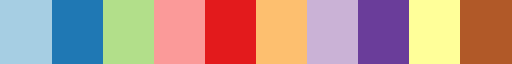

['#a6cee3',
 '#1f78b4',
 '#b2df8a',
 '#fb9a99',
 '#e31a1c',
 '#fdbf6f',
 '#cab2d6',
 '#6a3d9a',
 '#ffff99',
 '#b15928']

In [12]:
# Definindo paleta de cores para os gráficos

# Utilizando a paleta de cores viridis
vcmap = plt.get_cmap("Paired", 10)

# Exibindo o mapa de cores
display(vcmap)

# Convertendo o mapa de cores em um vetor para uso de cores indiviuais
coresPaired = [mpl.colors.rgb2hex(vcmap(i)) for i in range(10)] # extrai lista de cores em hex
display(coresPaired)

# Definindo uma cor default
corDefault = coresPaired[1]

# Definindo uma lisa de cores
cores = ['#a6cee3', '#1f78b4', '#b2df8a', '#fb9a99', '#e31a1c', '#fdbf6f', '#cab2d6', '#6a3d9a', '#ffff99', '#b15928']

Identificando se há desbalanceamento das classes na base de dados utilizada.

Churn
0    8500
1    1627
dtype: int64


0    83.934038
1    16.065962
Name: Churn, dtype: float64


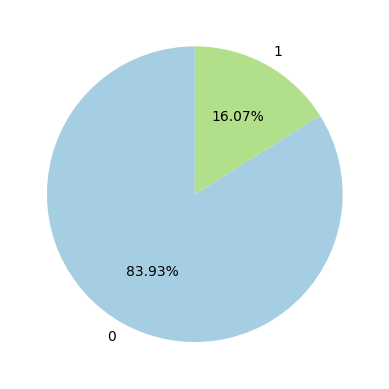

In [13]:
# Verificando se há desblanceamento de classes

# Quantificando a quantidade de clientes "churn" e "não churn"
print(clientes.groupby('Churn').size())
print("\n")

# Exibindo o percentual de clientes "churn" e "não churn"
print(clientes['Churn'].value_counts() / len(clientes['Churn']) * 100)

# Plotando um gráfico de pizza com a distribuição dos clientes "churn" e "não churn"
fig, ax = plt.subplots()
labels = clientes['Churn'].unique()
ax.pie(clientes.groupby('Churn').size(), colors = ('#a6cee3','#b2df8a') ,labels = labels, autopct= '%1.2f%%' ,startangle = 90)
plt.show()

Podemos observar que os clientes classificados como "churn" correspondem à 16,07% do total de clientes análisados e que a base de dados utilizadas está desbalanceada.

####3.2 Visualizações Unimodais

Analisando os atributos númericos do dataset através da criação de histogramas.

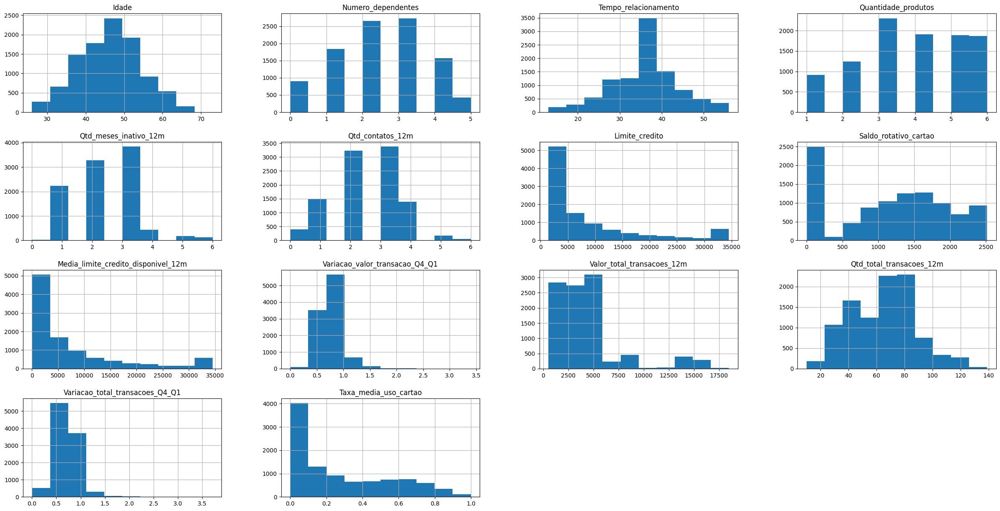

In [14]:
# Criando um histograma para cada atributo do dataset

# Histograma
clientes.drop('ID_Cliente', axis = 1).hist(figsize = (30, 15)) # Excluindo a coluna "ID-Cliente" da exibição dos gráficos de Histogramas
plt.show()

Analisando os histogramas de cada um dos atributos numéricos do dataset é possivel observar que os atributos Idade, Numero_dependentes, Tempo_relacionamento, Variacao_total_transações_Q4_Q1, Qtd_total_transacoes_12m e Variacao_valor_transacao_Q4_Q1 parecem seguir uma distribuição aproximadamente normal.

Os atributos Limite_Credito, Media_limite_credito_disponivel_12m, Valor_total_transacoes_12m e Taxa_media_uso_cartao parecem seguir uma distribuição exponencial.

A maior parte dos clientes possui entre 30 e 60 anos de idade, metade da amostra possui 2 ou 3 dependentes. A maior parte dos clientes têm tempo de relacionamento entre 30 e 40 meses e possui acim a de 3 produtos contratados no banco.

Quase a totalidade dos clientes possui valor total de transações de até 6 mil e com quantidade total de transações nos últimos 12 meses variando entre 20 e 100 transações.

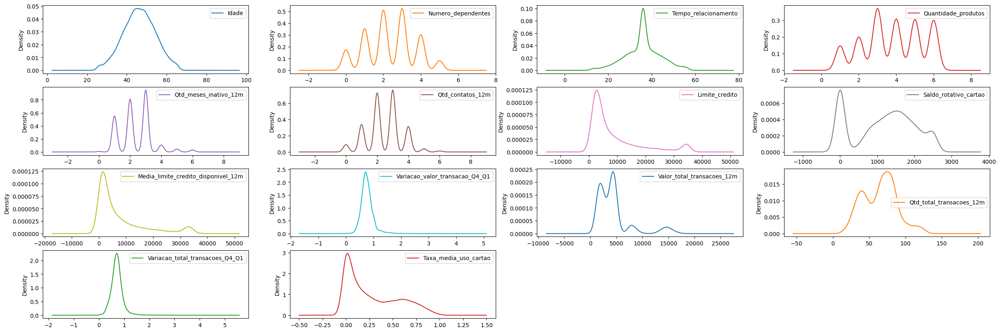

In [15]:
# Criando um Density Plot de cada atributo do dataset
# Excluindo a coluna "ID-Cliente" da exibição dos gráficos de Densidade
clientes.drop('ID_Cliente', axis = 1).plot(kind = 'density', subplots = True, layout = (4, 4), sharex = False, figsize = (30, 10))
plt.show() 

Identificando a presença de Outliers no conjunto de dados utilizados.

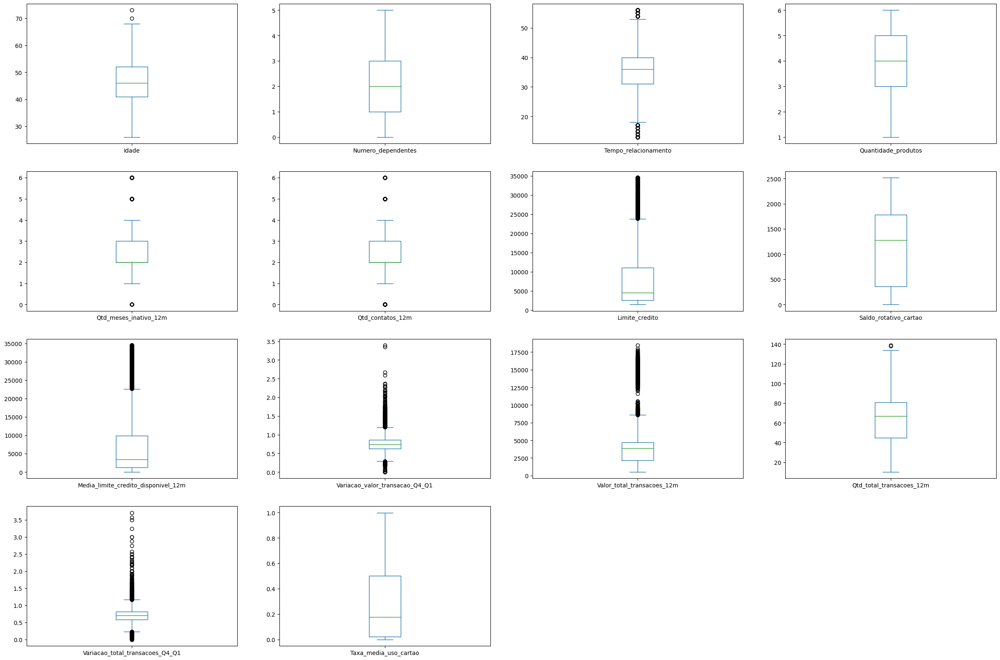

In [16]:
# Verificando a existência de outliers utilizando gráficos Boxplot
# Excluindo a coluna "ID-Cliente" da exibição dos gráficos de Densidade
clientes.drop('ID_Cliente', axis = 1).plot(kind = 'box', subplots = True, layout = (4, 4), sharex = False, sharey = False, figsize = (30, 20)) 
plt.show()

Podemos observar que os atributos Idade, Tempo_relacionamento, Qtd_meses_inativo_12m, Qtd_contatos_12m, Limite_credito, Media_limite_credito_disponivel_12m, Variacao_valor_transacao_Q4_Q1, Valor_total_transacoes_12m, Qtd_total_transacoes_12m e Variacao_total_transacoes_Q4_Q1 apresentam dados que podem ser considerados possíveis outliers, conforme os gráficos boxplots exibidos acima.

Para a exibição do percentual de clientes churn e não churn em cada subgrupo de cada atributo foi criada uma função para utilização nos gráficos produzidos a seguir. 

In [17]:
# Definindo uma função para exibir os rótulos das barras em percentual do total do atributo

def adiciona_rotulo_percentual(df, xVar, ax):

    """ Adiciona percentual correspondete como rótulo no gráfico de barras """

    # fonte:https://stackoverflow.com/a/67076347/4852724
    
    # Argumentos:
        # df: pandas dataframe
        # xVar: (string) variável X
        # ax: Axes object (para Seaborn Countplot/Bar plot ou pandas bar plot)
    
    # 1. Verificando a quantidade de Categorias (X)
    ## Checando se valores NaN e removendo
    numX = len([x for x in clientes[xVar].unique() if x == x])

    # 2. As barras são criadas em ordem de matiz (hue), sendo necessário organizá-las
    bars = ax.patches

    ## 2a. Para cada variável X
    for ind in range(numX):

        ## 2b. Obtendo todas as matizes das barras (hue bar)
        ##     ex: 8 categorias X, 4 matizes => [0, 8, 16, 24] são matizes das barras para a 1ª categoria X
        hueBars = bars[ind:][::numX]

        ## 2c. Obtendo a altura total (para porcentagens)
        total = sum([x.get_height() for x in hueBars])

        # 3. Printando as porcentagens nas barras
        for bar in hueBars:
            ax.text(bar.get_x() + bar.get_width()/2.,
                    bar.get_height(),
                    f'{bar.get_height()/total:.2%}',
                    ha = 'center', va = 'bottom', color = 'black')

Criando graficos dos atributos qualitativos para observação dos clientes churn e não churn.

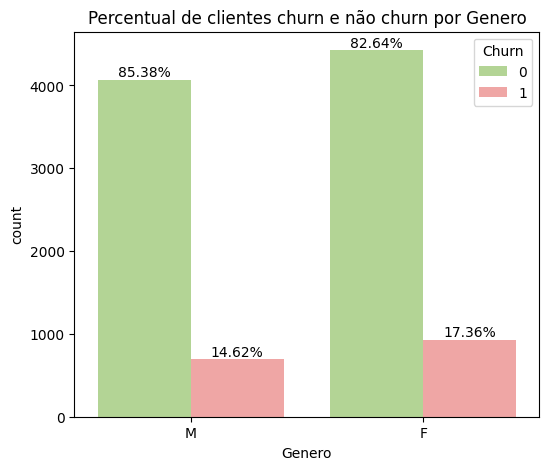

In [18]:
# Plotando os gráficos de barras utilizando a biblioteca seaborn para análise da varíavel Gênero
atributo = 'Genero'
fig = plt.figure(figsize = (6, 5))
ax = sns.countplot(data = clientes, x = atributo, hue = 'Churn', palette = cores[2:4])

# Adiciona os rotulos de percentual nas barras indicando o percentual de clientes "churn" e "não churn"
adiciona_rotulo_percentual(clientes, atributo, ax )

# adiciona um título aos gráficos dos atributos
plt.title(f'Percentual de clientes churn e não churn por {atributo}')

# Exibe os gráficos
plt.show()

Em relação ao atributo Gênero, é possível observar que o percentual de clientes churn é ligeramente maior para o publico feminino (17,36%) que o masculino (14,62%).

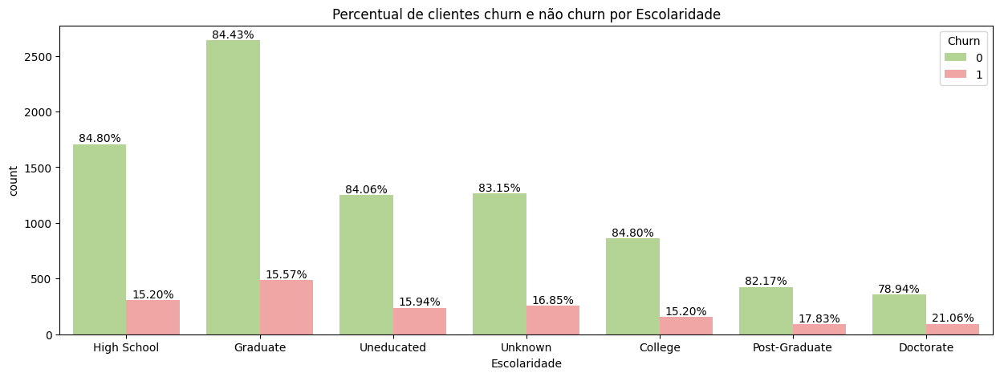

In [19]:
# Plotando os gráficos de barras utilizando a biblioteca seaborn para análise da varíavel Escolaridade
atributo = 'Escolaridade'
fig = plt.figure(figsize = (15, 5))
ax = sns.countplot(data = clientes, x = atributo, hue = 'Churn', palette = cores[2:4])

# Adiciona os rotulos de percentual nas barras indicando o percentual de clientes "churn" e "não churn"
adiciona_rotulo_percentual(clientes, atributo, ax )

# adiciona um título aos gráficos dos atributos
plt.title(f'Percentual de clientes churn e não churn por {atributo}')

# Exibe os gráficos
plt.show()

Em relação ao nível de escolaridade dos clientes, é possível perceber que o percentual de clientes churn é maior em clientes com maior nível de escolaridade, como por exemplor nos clientes com nível Doctorate (21,06%) e Post-Graduate (17,83%), mas com percentual acima de 15% em todos os grupos deste atributo.

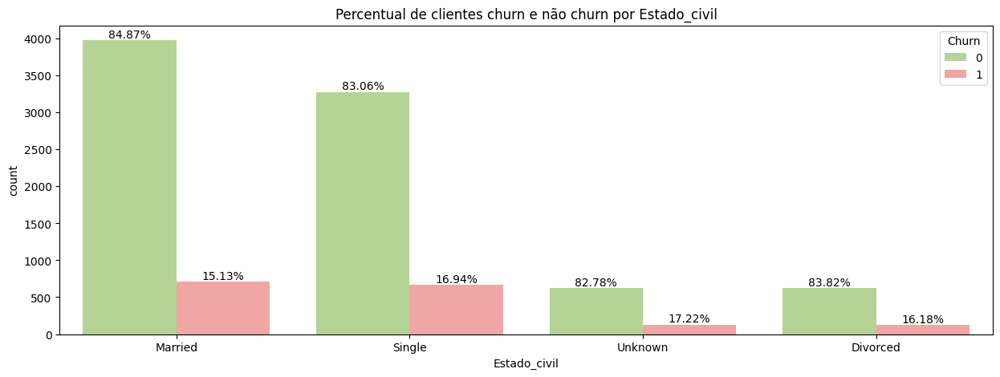

In [20]:
# Plotando os gráficos de barras utilizando a biblioteca seaborn para análise da varíavel Estado Cívil
atributo = 'Estado_civil'
fig = plt.figure(figsize = (15, 5))
ax = sns.countplot(data = clientes, x = atributo, hue = 'Churn', palette = cores[2:4])

# Adiciona os rotulos de percentual nas barras indicando o percentual de clientes "churn" e "não churn"
adiciona_rotulo_percentual(clientes, atributo, ax )

# adiciona um título aos gráficos dos atributos
plt.title(f'Percentual de clientes churn e não churn por {atributo}')

# Exibe os gráficos
plt.show()

Em relação ao estado cívil dos clientes, observamos que o percentual de clientes churn é maior em clientes solteiros (16,94%) e com estado cívil não declarado (17,22%).

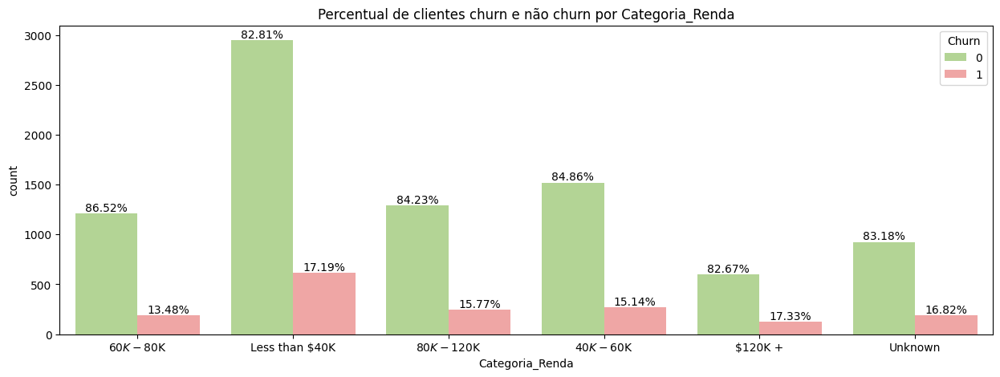

In [21]:
# Plotando os gráficos de barras utilizando a biblioteca seaborn para análise da varíavel Categoria_Renda
atributo = 'Categoria_Renda'
fig = plt.figure(figsize = (15, 5))
ax = sns.countplot(data = clientes, x = atributo, hue = 'Churn', palette = cores[2:4])

# Adiciona os rotulos de percentual nas barras indicando o percentual de clientes "churn" e "não churn"
adiciona_rotulo_percentual(clientes, atributo, ax )

# adiciona um título aos gráficos dos atributos
plt.title(f'Percentual de clientes churn e não churn por {atributo}')

# Exibe os gráficos
plt.show()

Em relação à renda dos clientes pecebemos que os clientes com renda anual superior a 120 mil e inferior a 40 mil têm os maiores percentuais de churn (17,33% e 17,19%), respectivamente.

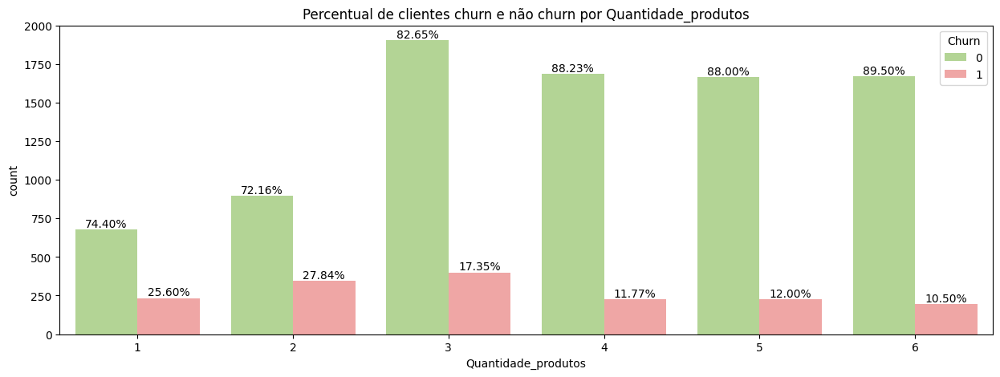

In [22]:
# Plotando os gráficos de barras utilizando a biblioteca seaborn para análise da varíavel Quantidade_produtos
atributo = 'Quantidade_produtos'
fig = plt.figure(figsize = (15, 5))
ax = sns.countplot(data = clientes, x = atributo, hue = 'Churn', palette = cores[2:4])

# Adiciona os rotulos de percentual nas barras indicando o percentual de clientes "churn" e "não churn"
adiciona_rotulo_percentual(clientes, atributo, ax )

# adiciona um título aos gráficos dos atributos
plt.title(f'Percentual de clientes churn e não churn por {atributo}')

# Exibe os gráficos
plt.show()

Também podemos observar que a quantidade de produtos consumidos pelos clientes pode ter relação inversa com o percentual de clientes que deixam de utilizar o cartão de crédito do banco. Cliente que possuem até 2 produtos apena tem percentual de churn acima de 25% enquanto que clientes que 4 ou mais produtos tem apenas 12% ou menos de clientes classificados como churn.

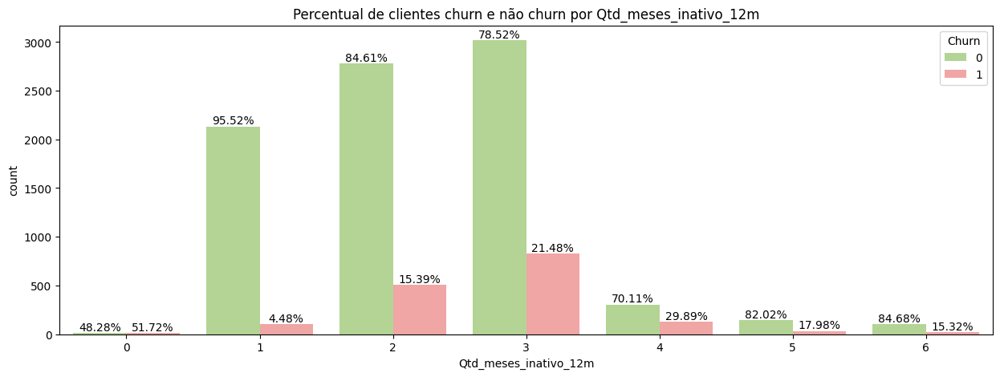

In [23]:
# Plotando os gráficos de barras utilizando a biblioteca seaborn para análise da varíavel Qtd_meses_inativo_12m
atributo = 'Qtd_meses_inativo_12m'
fig = plt.figure(figsize = (15, 5))
ax = sns.countplot(data = clientes, x = atributo, hue = 'Churn', palette = cores[2:4])

# Adiciona os rotulos de percentual nas barras indicando o percentual de clientes "churn" e "não churn"
adiciona_rotulo_percentual(clientes, atributo, ax )

# adiciona um título aos gráficos dos atributos
plt.title(f'Percentual de clientes churn e não churn por {atributo}')

# Exibe os gráficos
plt.show()

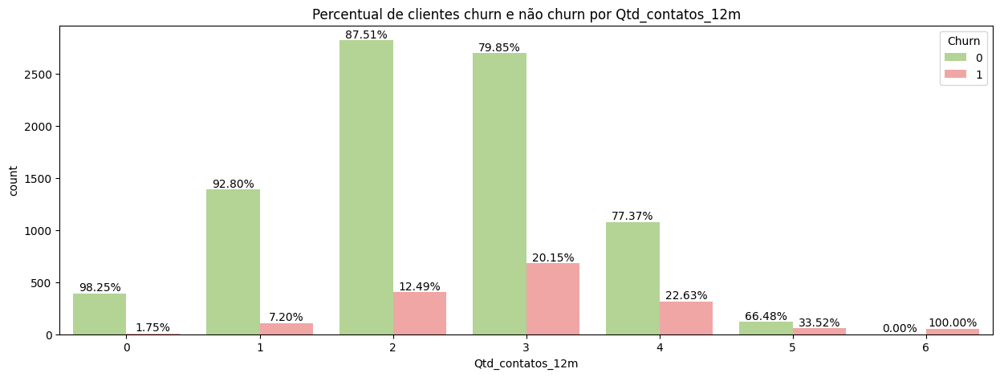

In [24]:
# Plotando os gráficos de barras utilizando a biblioteca seaborn para análise da varíavel Qtd_contatos_12m
atributo = 'Qtd_contatos_12m'
fig = plt.figure(figsize = (15, 5))
ax = sns.countplot(data = clientes, x = atributo, hue = 'Churn', palette = cores[2:4])

# Adiciona os rotulos de percentual nas barras indicando o percentual de clientes "churn" e "não churn"
adiciona_rotulo_percentual(clientes, atributo, ax )

# adiciona um título aos gráficos dos atributos
plt.title(f'Percentual de clientes churn e não churn por {atributo}')

# Exibe os gráficos
plt.show()

Em relação a quantidade de meses de inatividade nos últimos 12 meses e quantidades de contatos recebidos nos ultimos 12 meses não ficam claras as relações entre o tempo de inatividade com a iniciativa do cliente de deixar de fazer negócios com o banco, uma vez que o maior percentual de churn está localizado em clientes com 3 meses de inatividade (21,48%) e não com 6 meses (15,32%) como poderia ser esperado, e a quantidade de contatos realizados com o cliente nos últimos 12 meses e o percentual de churn, já que clientes que apresentaram maior quantidade de contatos, 4 ou 5 contatos nos últimos 12 meses, apresentaram também maior percentual de churn (22,63% e 33,52%).

####3.3.Visualizações Multimodais

Analisando a correlação das atributos disponíveis no dataset clientes.

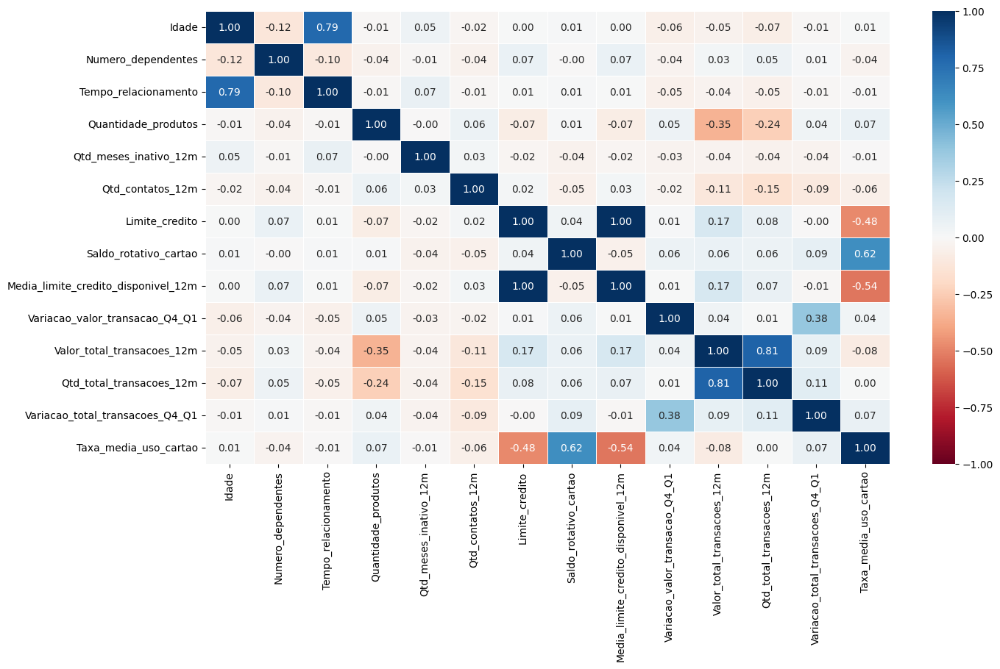

In [25]:
# Matriz de Correlação com Matplotlib Seaborn
# Excluindo a coluna "ID-Cliente" da Matriz de Correlação
plt.figure(figsize = (15, 8))
sns.heatmap(clientes.drop('ID_Cliente', axis = 1).corr(), annot = True, cmap = 'RdBu', fmt = ".2f", linewidth =.5, xticklabels = "auto", yticklabels = "auto", vmin = -1, vmax = 1);

Em relação a Matriz de Correlação, podemos observar que as variávies abaixo estão positivamente correlacionadas, apresentando correlação positiva acima de 0,5:

*   Tempo de Relacionamento e Idade: **0,79**
*   Média de limite de crédito disponível nos últimos 12 meses e Limite de Crédito: **1,00**
*   Saldo rotativo no cartão e Taxa média de utilização do cartão: **0,62**
*   Valor total das transações nos últimos 12 meses e Quantidade total de transações nos últimos 12 meses: **0,81**

As variáveis Média de limite de crédito disponível nos últimos 12 meses e Taxa média de uso do cartão apresentaram uma correlação negativa significativa de **-0,54**.

Para verificar o relacionamento entre pares de atributos do dataset vamos utilizar o scatter plot da biblioteca Seaborn.

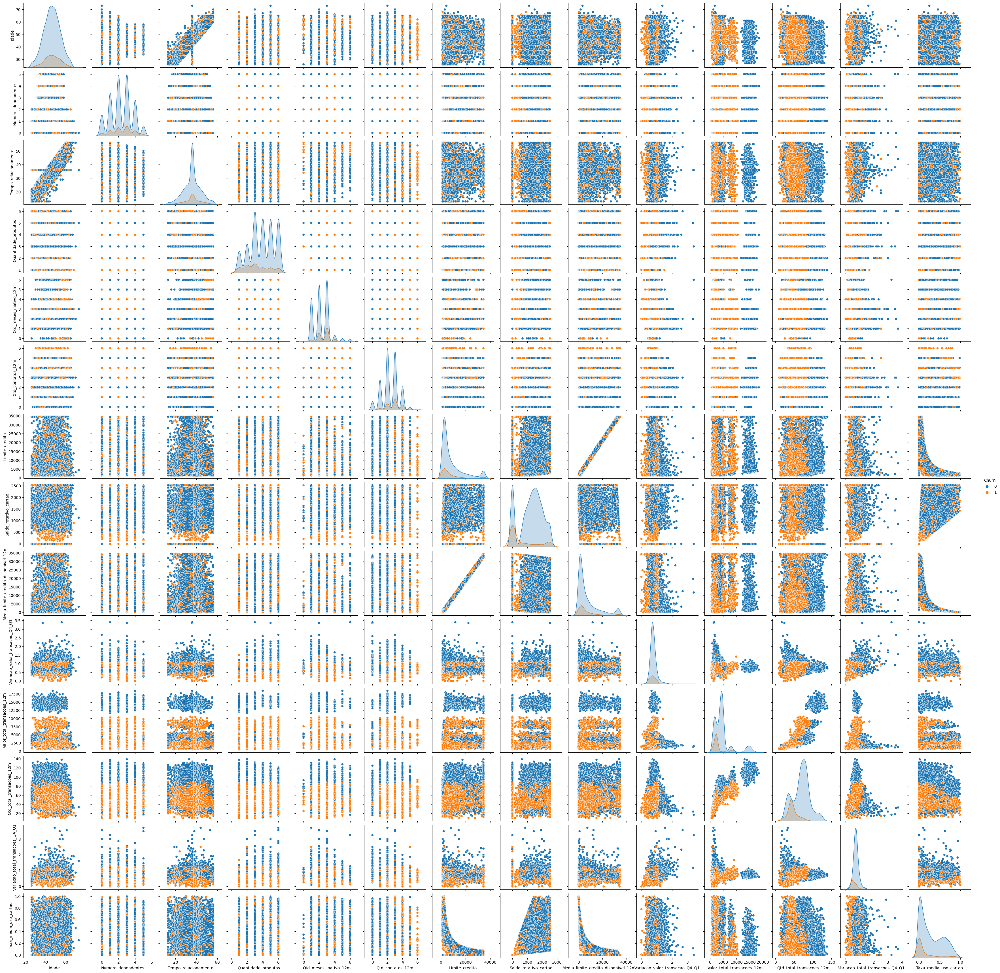

In [26]:
# Utilizando Grafícos de Dispersão para mostrar o relacionamento entre as variávies do dataset
sns.pairplot(clientes.drop('ID_Cliente', axis = 1), hue = "Churn", height = 2.5)

Utilizando o gráfico de dispersão é possível perceber relações positivas entre as variávies Idade e Tempo de relacionamento, entre Limite de crédito e Média limite de crédito disponível e entre Quantidade total de transações nos últimos 12 meses e Valor total das transações nos últimos 12 meses.

##4.Pré-processamento de dados


####4.1 Tratamento de Missings e Limpeza

In [27]:
# Verifiicando se há valores duplicados no dataset clientes

clientes[clientes['ID_Cliente'].duplicated()] # Não há valores duplicados no dataset

,ID_Cliente,Idade,Genero,Numero_dependentes,Escolaridade,Estado_civil,Categoria_Renda,Categoria_Cartao,Tempo_relacionamento,Quantidade_produtos,...,Qtd_contatos_12m,Limite_credito,Saldo_rotativo_cartao,Media_limite_credito_disponivel_12m,Variacao_valor_transacao_Q4_Q1,Valor_total_transacoes_12m,Qtd_total_transacoes_12m,Variacao_total_transacoes_Q4_Q1,Taxa_media_uso_cartao,Churn


Não identificamos dados duplicados no dataset utilizado.

In [28]:
# Verificando nulls no dataset
clientes.isnull().sum()

ID_Cliente                             0
Idade                                  0
Genero                                 0
Numero_dependentes                     0
Escolaridade                           0
Estado_civil                           0
Categoria_Renda                        0
Categoria_Cartao                       0
Tempo_relacionamento                   0
Quantidade_produtos                    0
Qtd_meses_inativo_12m                  0
Qtd_contatos_12m                       0
Limite_credito                         0
Saldo_rotativo_cartao                  0
Media_limite_credito_disponivel_12m    0
Variacao_valor_transacao_Q4_Q1         0
Valor_total_transacoes_12m             0
Qtd_total_transacoes_12m               0
Variacao_total_transacoes_Q4_Q1        0
Taxa_media_uso_cartao                  0
Churn                                  0
dtype: int64

Não há dados faltantes no dataset que necessitem de tratamento.

Verificando a distribuição dos valores de cada atributo categórico.

In [29]:
# Exibindo o percentual de cada valor existente em cada atributo categórico

for var in variaveis_categoricas:
    print(var) # Exibindo o nome da atributo
    print(clientes[var].value_counts()/len(clientes) * 100) # Contando os valores de cada atributo e dividindo pelo tamanho do dataset
    print("\n")

Genero
F    52.908068
M    47.091932
Name: Genero, dtype: float64


Escolaridade
Graduate         30.887726
High School      19.877555
Unknown          14.999506
Uneducated       14.683519
College          10.002962
Post-Graduate     5.095290
Doctorate         4.453441
Name: Escolaridade, dtype: float64


Estado_civil
Married     46.282216
Single      38.935519
Unknown      7.396070
Divorced     7.386195
Name: Estado_civil, dtype: float64


Categoria_Renda
Less than $40K    35.163425
$40K - $60K       17.675521
$80K - $120K      15.157500
$60K - $80K       13.844179
Unknown           10.980547
$120K +            7.178829
Name: Categoria_Renda, dtype: float64


Categoria_Cartao
Blue        93.176656
Silver       5.480399
Gold         1.145453
Platinum     0.197492
Name: Categoria_Cartao, dtype: float64




Analisando a distribuição dos valores de cadas atributo categórico, podemos perceber que há valores classificados como "Unknown" (desconhecido) que podem ser considerados dados faltantes no base de dados original.

Para tratamento destes valores, que podem distorcer o modelo, vamos subistituí-los por missings e fazer o seu tratamento, atribuindo o conjunto de dados resultante em um novo dataset.

<Axes: >

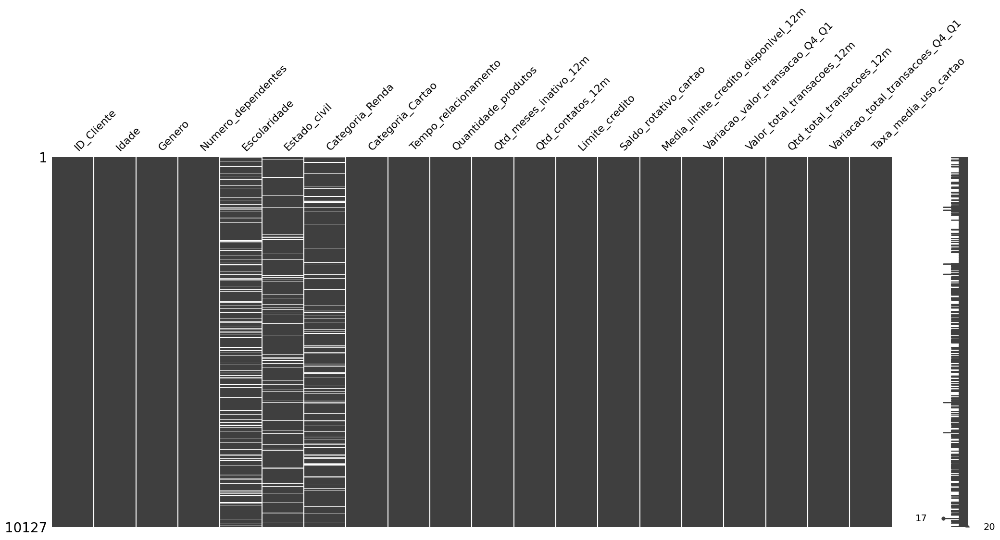

In [30]:
# Salvando um novo dataset para subsituição dos valores "Unknown" por missings e posterior tratamento

# Recuperando o nome das colunas
col = list(clientes.columns)

# O novo dataset irá conter todas as colunas com exceção da última coluna ('Churn')
clientes_missing = clientes[col[0:-1]]

# substitundo os valores "Unknown" por NaN
clientes_missing.replace("Unknown", np.nan, inplace = True)

# Exibindo visualização matricial da nulidade do dataset "clientes_missing"
ms.matrix(clientes_missing)

A exibição da matriz de nulidade dos dados possibilitou verificar que os dados missings se concentram nos atributos Escolaridade, Estado_civil e Categoria_Renda.

Como os dados faltantes referem-se a atributos categóricos e a atribuição de valores mais frequentes, nesse caso, pode distorcer o resultado do modelo, optamos por excluir as linhas com valores missings do novo conjunto de dados.

In [31]:
# Excluindo as linhas com valores missing e atribuindo ao um novo dataset
clientes_sem_missing = clientes_missing.dropna(how = 'any')

# Incluindo a coluna "Churn" no novo dataset
clientes_sem_missing['Churn'] = clientes['Churn']

# Exibindo as informações do novo dataset "clientes_sem_missing"
clientes_sem_missing.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7081 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   ID_Cliente                           7081 non-null   int64  
 1   Idade                                7081 non-null   int64  
 2   Genero                               7081 non-null   object 
 3   Numero_dependentes                   7081 non-null   int64  
 4   Escolaridade                         7081 non-null   object 
 5   Estado_civil                         7081 non-null   object 
 6   Categoria_Renda                      7081 non-null   object 
 7   Categoria_Cartao                     7081 non-null   object 
 8   Tempo_relacionamento                 7081 non-null   int64  
 9   Quantidade_produtos                  7081 non-null   int64  
 10  Qtd_meses_inativo_12m                7081 non-null   int64  
 11  Qtd_contatos_12m             

Com a exclusão das linhas com valores missing o conjunto de dados passou a contar com 7081 instâncias e 21 atributos, incluindo a coluna **"ID_Cliente"**.

Examinando como ficou a distribuição percentual dos valores de cada atributo após a exclusão das instâncias com valores missing.

In [32]:
# Exibindo o percentual de cada valor existente em cada atributo categórico no nova dataset "clientes_sem_missing"

for var in variaveis_categoricas:
    print(var) # Exibindo o nome da atributo
    print(clientes_sem_missing[var].value_counts()/len(clientes_sem_missing) * 100) # Contando os valores de cada atributo e dividindo pelo tamanho do dataset
    print("\n")

Genero
M    52.337241
F    47.662759
Name: Genero, dtype: float64


Escolaridade
Graduate         36.590877
High School      23.344160
Uneducated       17.003248
College          11.919220
Post-Graduate     6.086711
Doctorate         5.055783
Name: Escolaridade, dtype: float64


Estado_civil
Married     50.331874
Single      41.632538
Divorced     8.035588
Name: Estado_civil, dtype: float64


Categoria_Renda
Less than $40K    39.429459
$40K - $60K       19.940686
$80K - $120K      16.975004
$60K - $80K       15.576896
$120K +            8.077955
Name: Categoria_Renda, dtype: float64


Categoria_Cartao
Blue        93.178930
Silver       5.521819
Gold         1.143906
Platinum     0.155345
Name: Categoria_Cartao, dtype: float64




In [33]:
# Exibindo o sumário estatístico do dataset "clientes_sem_missing" após a exclusão das linhas com missing
clientes_sem_missing.drop('ID_Cliente', axis = 1).describe().T

,count,mean,std,min,25%,50%,75%,max
Idade,7081.0,46.347691,8.041225,26.0,41.000,46.000,52.000,73.000
Numero_dependentes,7081.0,2.337805,1.291649,0.0,1.000,2.000,3.000,5.000
Tempo_relacionamento,7081.0,35.981359,8.002609,13.0,31.000,36.000,40.000,56.000
Quantidade_produtos,7081.0,3.819376,1.544444,1.0,3.000,4.000,5.000,6.000
Qtd_meses_inativo_12m,7081.0,2.342607,0.995104,0.0,2.000,2.000,3.000,6.000
Qtd_contatos_12m,7081.0,2.454456,1.104917,0.0,2.000,2.000,3.000,6.000
Limite_credito,7081.0,8492.773831,9126.072520,1438.3,2498.000,4287.000,10729.000,34516.000
Saldo_rotativo_cartao,7081.0,1167.501624,812.315606,0.0,463.000,1282.000,1781.000,2517.000
Media_limite_credito_disponivel_12m,7081.0,7325.272207,9131.217585,3.0,1248.000,3250.000,9491.000,34516.000
Variacao_valor_transacao_Q4_Q1,7081.0,0.760584,0.223139,0.0,0.629,0.735,0.858,3.397


In [60]:
# Realizando a transformação das variavies 'Genero', 'Escolaridade', 'Estado_civil', 'Categoria_Renda', 'Categoria_Cartao'

# Fazendo uma copia do dataset clientes_sem_missing
clientes_sm_copia = clientes_sem_missing.copy()

# Definindo a lista de categorias para transformação
lista_categorias = ['Genero', 'Escolaridade', 'Estado_civil', 'Categoria_Renda', 'Categoria_Cartao']

# Realizando a transformação das variáveis
clientes_sm_copia2 = pd.get_dummies(clientes_sm_copia, columns = lista_categorias, drop_first = False)

clientes_sm_copia2.head()

,ID_Cliente,Idade,Numero_dependentes,Tempo_relacionamento,Quantidade_produtos,Qtd_meses_inativo_12m,Qtd_contatos_12m,Limite_credito,Saldo_rotativo_cartao,Media_limite_credito_disponivel_12m,...,Estado_civil_Single,Categoria_Renda_$120K +,Categoria_Renda_$40K - $60K,Categoria_Renda_$60K - $80K,Categoria_Renda_$80K - $120K,Categoria_Renda_Less than $40K,Categoria_Cartao_Blue,Categoria_Cartao_Gold,Categoria_Cartao_Platinum,Categoria_Cartao_Silver
0,768805383,45,3,39,5,1,3,12691.0,777,11914.0,...,0,0,0,1,0,0,1,0,0,0
1,818770008,49,5,44,6,1,2,8256.0,864,7392.0,...,1,0,0,0,0,1,1,0,0,0
2,713982108,51,3,36,4,1,0,3418.0,0,3418.0,...,0,0,0,0,1,0,1,0,0,0
4,709106358,40,3,21,5,1,0,4716.0,0,4716.0,...,0,0,0,1,0,0,1,0,0,0
5,713061558,44,2,36,3,1,2,4010.0,1247,2763.0,...,0,0,1,0,0,0,1,0,0,0


In [61]:
# Realizando a transformação categóricas das variavies 'Genero', 'Escolaridade', 'Estado_civil', 'Categoria_Renda', 'Categoria_Cartao'

#dfcopia = clientes_sem_missing.copy()
lista_categorias = ['Genero', 'Escolaridade', 'Estado_civil', 'Categoria_Renda', 'Categoria_Cartao']

# definindo o transformador como one hot enconding (com Dummy variable encoder)
encoder = OneHotEncoder(drop = 'first', sparse = False, categories = lista_categorias)

# transformando os dados
onehot = encoder.fit_transform(dfcopia)

ValueError: ignored

####4.2.Separação em conjunto de treino e conjunto de teste

In [35]:
test_size = 0.20
seed = 0

# Separação em conjuntos de treino e teste (dataset original)
array = clientes_sem_missing.values
X = array[:,0:-1]
y = array[:,-1]

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size = test_size,
                                                    shuffle = True,
                                                    random_state = seed,
                                                    stratify = y)
print(X_train)
print(y_train)

[[754282908 50 'F' ... 59 0.686 0.251]
 [789504183 37 'M' ... 62 0.771 0.0]
 [717172308 45 'F' ... 32 0.28 0.0]
 ...
 [795052083 63 'F' ... 71 0.578 0.0]
 [711944733 45 'F' ... 93 0.661 0.568]
 [712517808 42 'M' ... 112 0.697 0.466]]
['0' '0' '1' ... '0' '0' '0']


In [36]:
clientes_sem_missing.columns

Index(['ID_Cliente', 'Idade', 'Genero', 'Numero_dependentes', 'Escolaridade',
       'Estado_civil', 'Categoria_Renda', 'Categoria_Cartao',
       'Tempo_relacionamento', 'Quantidade_produtos', 'Qtd_meses_inativo_12m',
       'Qtd_contatos_12m', 'Limite_credito', 'Saldo_rotativo_cartao',
       'Media_limite_credito_disponivel_12m', 'Variacao_valor_transacao_Q4_Q1',
       'Valor_total_transacoes_12m', 'Qtd_total_transacoes_12m',
       'Variacao_total_transacoes_Q4_Q1', 'Taxa_media_uso_cartao', 'Churn'],
      dtype='object')

In [37]:
# Aplicando normalização nos dados da base de treino

# Fazendo uma cópia da base de treino para Normalização
X_train_copia = X_train
print(X_train_copia)

# definindo o transformador como min max scaler
scaler = MinMaxScaler()

# transformando os dados
#X_train_copia[['Limite_credito']] = scaler.fit_transform(X[['Limite_credito']])

[[754282908 50 'F' ... 59 0.686 0.251]
 [789504183 37 'M' ... 62 0.771 0.0]
 [717172308 45 'F' ... 32 0.28 0.0]
 ...
 [795052083 63 'F' ... 71 0.578 0.0]
 [711944733 45 'F' ... 93 0.661 0.568]
 [712517808 42 'M' ... 112 0.697 0.466]]
